In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow info messages

print(sys.version)

import tensorflow as tf
print(tf.__version__)

from src.preprocessing import *
from src.display import *
from src.training import *

import math

3.10.12 (main, Jun  8 2023, 17:32:40) [MSC v.1936 64 bit (AMD64)]
2.17.0


In [2]:
print(tf.config.list_physical_devices('GPU'))

[]


In [2]:
train_folder = "data/train"
val_folder = "data/test"

nii_images_train = list_nii_files(train_folder, 'Flair-Brain.nii')
nii_masks_train = list_nii_files(train_folder, 'LesionSeg-Flair.nii')
nii_images_val = list_nii_files(val_folder, 'Flair-Brain.nii')
nii_masks_val = list_nii_files(val_folder, 'LesionSeg-Flair.nii')


In [3]:
images_train = load_all_data(nii_images_train)
masks_train = load_all_data(nii_masks_train)
images_val = load_all_data(nii_images_val)
masks_val = load_all_data(nii_masks_val)

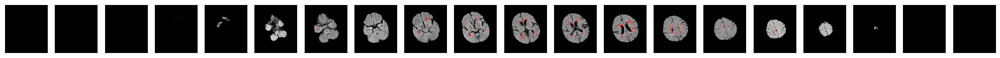

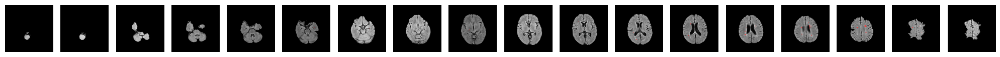

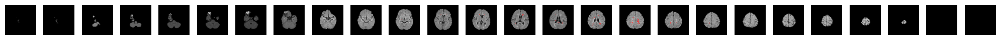

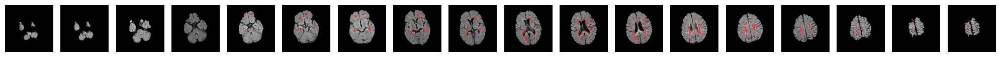

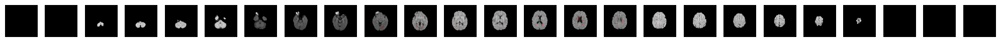

In [21]:
for i, (image, mask) in enumerate(zip(images_train[:5], masks_train[:5])):
    display_image(image, mask, rows=1)

In [4]:
resized_images_train = resize_all_images(images_train)
resized_masks_train = resize_all_images(masks_train)

resized_images_val = resize_all_images(images_val)
resized_masks_val = resize_all_images(masks_val)

# assert that the shapes are the same in mask and scan (x and y dimensions)
# for image, mask in zip(resized_images_train, resized_masks_train):
#     assert image.shape[:-1] == mask.shape[:-1]

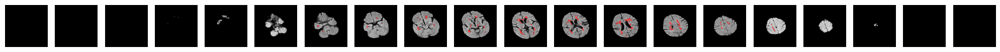

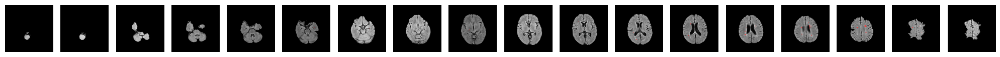

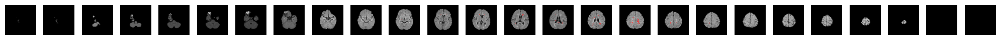

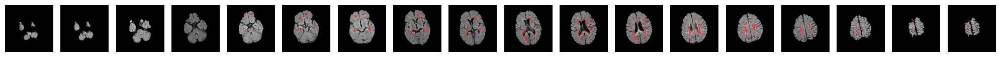

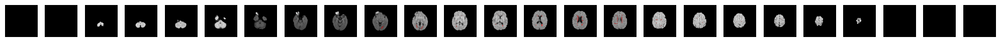

In [23]:
for i, (image, mask) in enumerate(zip(resized_images_train[:5], resized_masks_train[:5])):
    display_image(image, mask, rows=1)

In [5]:
normalized_images_train = normalize_images(resized_images_train)
normalized_images_val = normalize_images(resized_images_val)

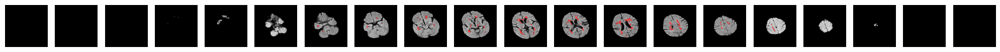

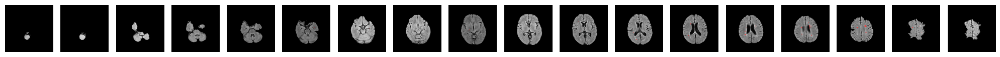

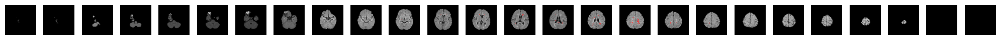

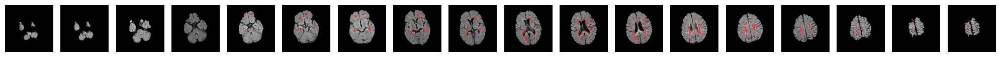

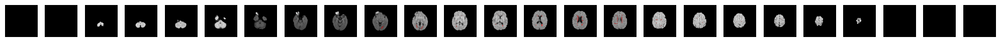

In [25]:
for i, (image, mask) in enumerate(zip(normalized_images_train[:5], resized_masks_train[:5])):
    display_image(image, mask, rows=1)

In [6]:
# Keep only slices that contain lesions
filtered_images_train, filtered_masks_train = filter_slices_with_lesions(normalized_images_train, resized_masks_train)
filtered_images_val, filtered_masks_val = filter_slices_with_lesions(resized_images_val, resized_masks_val)

# Output the number of slices remaining for each scan after filtering
for i, (filtered_image_train, filtered_mask_train) in enumerate(zip(filtered_images_train, filtered_masks_train)):
    print(f"Scan {i + 1}: {filtered_image_train.shape[-1]} slices remaining, corresponding mask shape: {filtered_mask_train.shape}")

Scan 1: 10 slices remaining, corresponding mask shape: (256, 256, 10)
Scan 2: 12 slices remaining, corresponding mask shape: (256, 256, 12)
Scan 3: 10 slices remaining, corresponding mask shape: (256, 256, 10)
Scan 4: 16 slices remaining, corresponding mask shape: (256, 256, 16)
Scan 5: 12 slices remaining, corresponding mask shape: (256, 256, 12)
Scan 6: 7 slices remaining, corresponding mask shape: (256, 256, 7)
Scan 7: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 8: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 9: 4 slices remaining, corresponding mask shape: (256, 256, 4)
Scan 10: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 11: 14 slices remaining, corresponding mask shape: (256, 256, 14)
Scan 12: 7 slices remaining, corresponding mask shape: (256, 256, 7)
Scan 13: 19 slices remaining, corresponding mask shape: (256, 256, 19)
Scan 14: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 15: 12 slices re

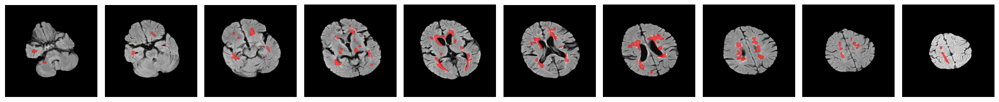

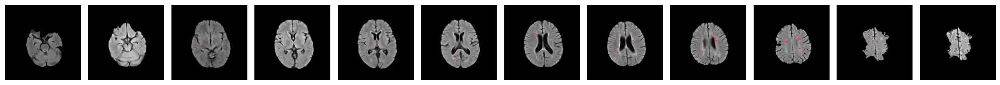

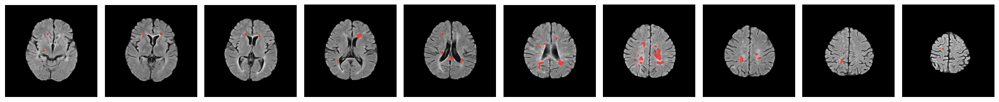

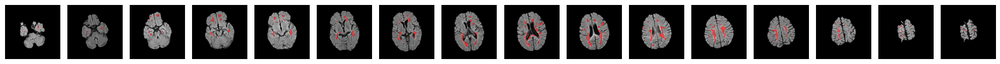

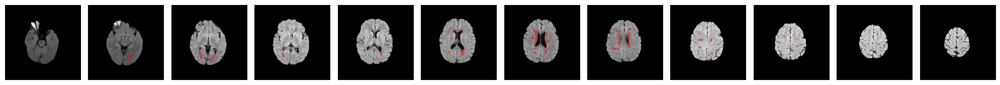

In [27]:
for i, (image, mask) in enumerate(zip(filtered_images_train[:5], filtered_masks_train[:5])):
    display_image(image, mask, rows=1)

In [7]:
# Stack 2D slices from all images
all_slices_train = stack_slices(filtered_images_train)
all_masks_train = stack_slices(filtered_masks_train)
all_slices_val = stack_slices(filtered_images_val)
all_masks_val = stack_slices(filtered_masks_val)

# Data Augmentation 

In [8]:
SEED = 1 # Seed to ensure the same augmentation is applied to both image and mask
BATCH_SIZE = 32

# Flow from memory
slice_iterator_train = get_augment_data_generator(False).flow(all_slices_train, seed=SEED, batch_size=BATCH_SIZE)
mask_iterator_train = get_augment_data_generator(True).flow(all_masks_train, seed=SEED, batch_size=BATCH_SIZE)

# Combined generator
iterator_train = get_combined_iterator(slice_iterator_train, mask_iterator_train)

# We probably don't want to augment the validation data?
slice_iterator_val = ImageDataGenerator().flow(all_slices_val, seed=SEED, batch_size=BATCH_SIZE)
mask_iterator_val = ImageDataGenerator().flow(all_masks_val, seed=SEED, batch_size=BATCH_SIZE)

iterator_val = get_combined_iterator(slice_iterator_val, mask_iterator_val)

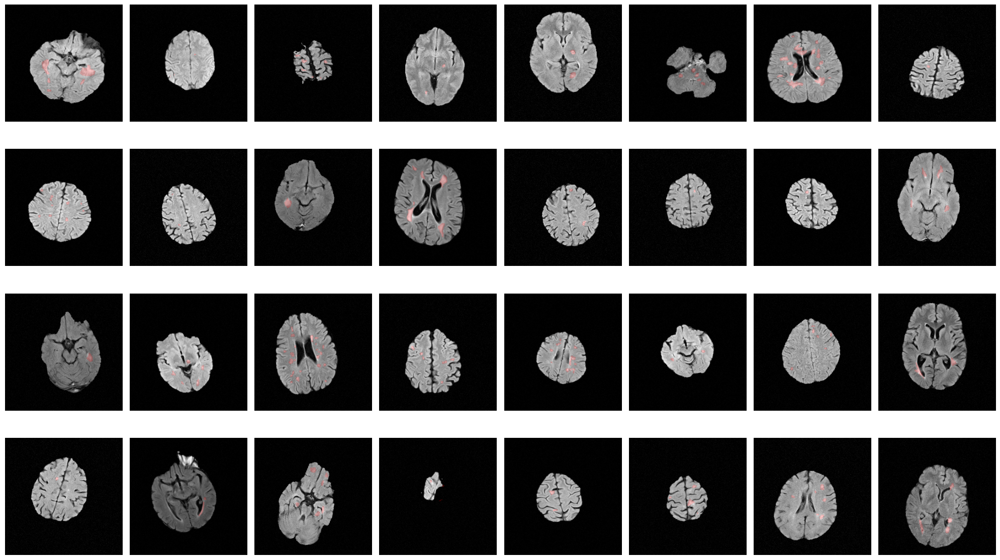

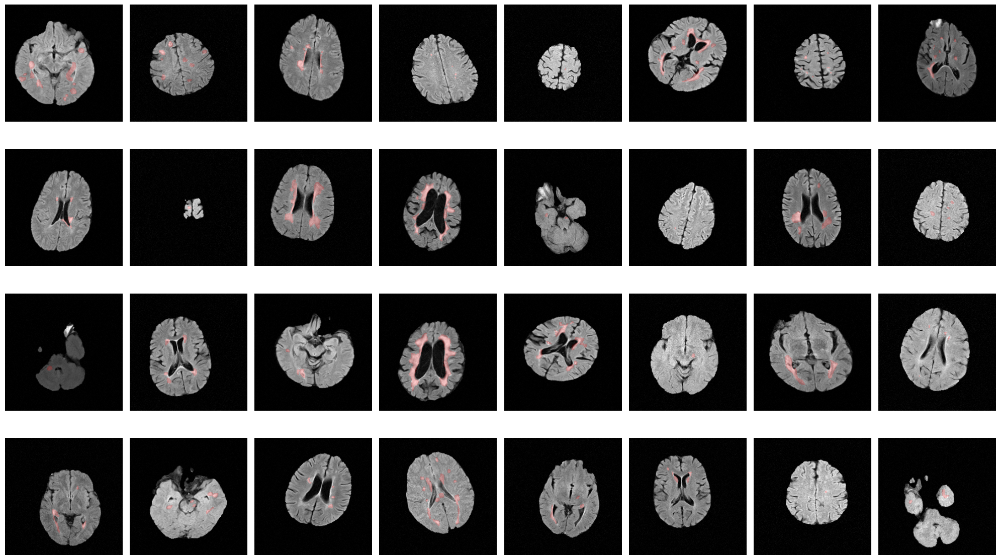

In [30]:
# Display augmented batches to check mask alignment
for n_batch in range(2):
    batch_slices, batch_masks = next(iterator_train)
    display_slices(batch_slices, batch_masks, alpha=0.2, rows=4)

# Model Training

In [9]:
import tensorflow as tf

tf.get_logger().setLevel('WARNING') # Suppress TensorFlow info messages

# Create and compile the model
model = build_unet_resnet50(input_shape=(256, 256, 1))
# model.summary()

## Adi Training Code - Including Tuning

In [19]:
!pip install keras_tuner

     ---------------------------------------- 0.0/129.1 kB ? eta -:--:--
     --------------------------------- ---- 112.6/129.1 kB 2.2 MB/s eta 0:00:01
     -------------------------------------- 129.1/129.1 kB 1.5 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
import tensorflow as tf
import keras_tuner as kt
import math

tf.get_logger().setLevel('WARNING')  # Suppress TensorFlow info messages

# Define the hypermodel function for Keras Tuner
def build_model(hp):
    # Hyperparameters to tune
    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-3, sampling='log')
    dropout_rate = hp.Float('dropout_rate', min_value=0.0, max_value=0.5, step=0.1)
    l2_reg = hp.Float('l2_reg', min_value=1e-6, max_value=1e-2, sampling='log')
    
    # Build the model using the hyperparameters
    model = build_unet_resnet50(l2_reg, dropout_rate, input_shape=(256, 256, 1))
    
    # Compile the model
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer,
                  loss=combined_loss,
                  metrics=[dice_coefficient])
    return model

# Initialize the Keras Tuner
tuner = kt.Hyperband(
    build_model,
    objective=kt.Objective('val_dice_coefficient', direction='max'),
    max_epochs=50,
    factor=3,
    hyperband_iterations=2,
    directory='my_dir',
    project_name='hyperparam_tuning'
)

# Early stopping callback
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_dice_coefficient', patience=5, mode='max')

# TensorBoard callback for visualization
tensorboard_cb = tf.keras.callbacks.TensorBoard('logs/hparam_tuning')

# Perform hyperparameter search
tuner.search(
    iterator_train,
    steps_per_epoch=len(all_slices_train) // BATCH_SIZE,
    validation_data=iterator_val,
    validation_steps=len(all_slices_val) // BATCH_SIZE,
    epochs=50,
    callbacks=[stop_early, tensorboard_cb]
)

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]


print(f"""
The hyperparameter search is complete.
The optimal learning rate is {best_hps.get('learning_rate')}.
The optimal L2 regularization strength is {best_hps.get('l2_reg')}.
The optimal dropout rate is {best_hps.get('dropout_rate')}.
""")

# Build the model with the optimal hyperparameters
model = tuner.hypermodel.build(best_hps)

# Define the cosine annealing function
def cosine_annealing(epoch, total_epochs, initial_lr, min_lr):
    return min_lr + (initial_lr - min_lr) * (1 + math.cos(math.pi * epoch / total_epochs)) / 2

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: cosine_annealing(epoch, total_epochs=50, initial_lr=best_hps.get('learning_rate'), min_lr=1e-6)
)

# Define callbacks
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_model_l2_reg.keras', save_best_only=True, monitor='val_dice_coefficient', mode='max'),
    lr_scheduler,
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coefficient', patience=10, mode='max', restore_best_weights=True),
    tensorboard_cb
]

# Train the model with the optimal hyperparameters
history = model.fit(
    iterator_train,
    steps_per_epoch=len(all_slices_train) // BATCH_SIZE,
    validation_data=iterator_val,
    validation_steps=len(all_slices_val) // BATCH_SIZE,
    epochs=50,
    callbacks=callbacks
)

# Evaluate the model
evaluation = model.evaluate(iterator_val, steps=len(all_slices_val) // BATCH_SIZE)
print(f"Validation Loss: {evaluation[0]}")
print(f"Validation Dice Coefficient: {evaluation[1]}")

# Print a summary of the hyperparameter tuning results
tuner.results_summary()

Trial 8 Complete [00h 16m 28s]
val_dice_coefficient: 0.27103379368782043

Best val_dice_coefficient So Far: 0.4917278587818146
Total elapsed time: 02h 16m 03s

Search: Running Trial #9

Value             |Best Value So Far |Hyperparameter
1.2193e-05        |0.00026491        |learning_rate
0.4               |0                 |dropout_rate
2                 |2                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
3                 |3                 |tuner/bracket
0                 |0                 |tuner/round

Epoch 1/2


KeyboardInterrupt: 

## Vis

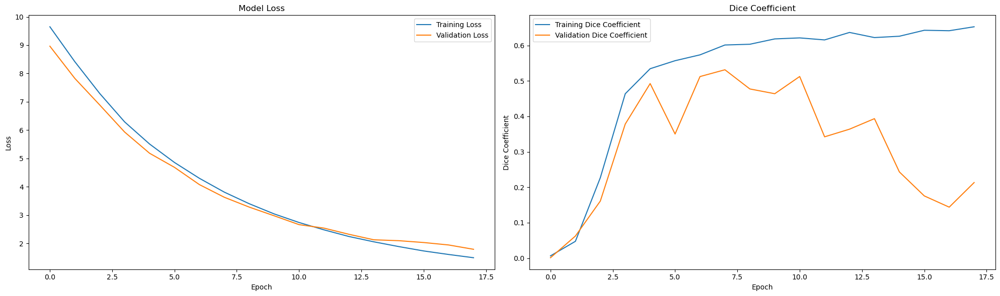

In [21]:
import matplotlib.pyplot as plt

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Plot training history
ax1.plot(history.history['loss'], label='Training Loss')
ax1.plot(history.history['val_loss'], label='Validation Loss')
ax1.set_title('Model Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot dice coefficients
ax2.plot(history.history['dice_coefficient'], label='Training Dice Coefficient')
ax2.plot(history.history['val_dice_coefficient'], label='Validation Dice Coefficient')
ax2.set_title('Dice Coefficient')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Dice Coefficient')
ax2.legend()

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

In [22]:
all_preds = model.predict(all_slices_val)
all_preds_binary = np.where(all_preds > 0.5, 1, 0)

5/5 [==============================] - 7s 1s/step


Display the predictions for all validation slices
- Red: Lesion mask (ground truth)
- Blue: Predicted lesion
- Yellow: Overlap

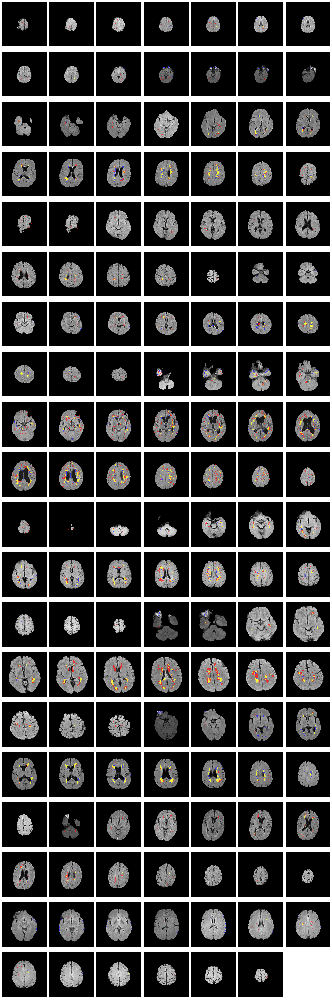

In [23]:
display_slices(all_slices_val, all_masks_val, all_preds_binary, alpha=0.7, rows=20)

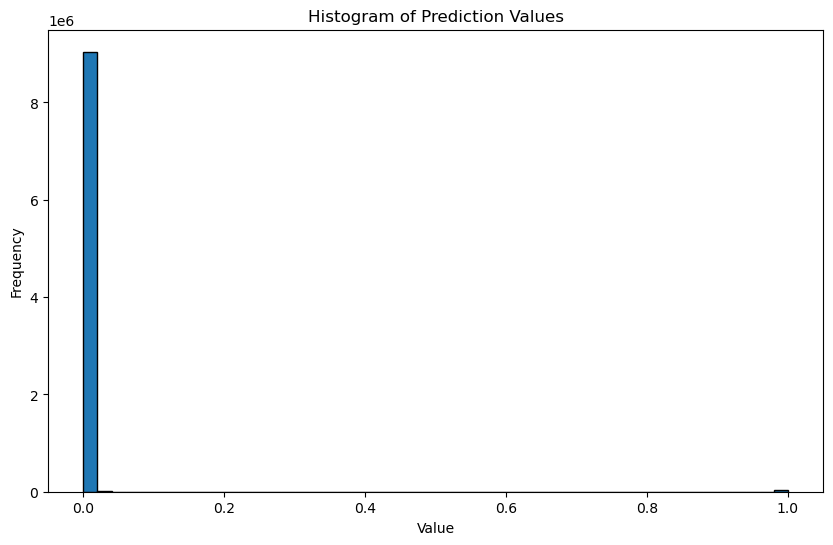

In [24]:
# Create the histogram
plt.figure(figsize=(10, 6))
plt.hist(all_preds.flatten(), bins=50, range=(0, 1), edgecolor='black')

plt.title('Histogram of Prediction Values')
plt.xlabel('Value')
plt.ylabel('Frequency')

plt.show()